## Oriented FAST and Rotated BRIEF (ORB)

object detection is one of the most challenging problems in computer vision. It is the ability to recognize particular objects and determine their location in an image. For example, for car detection in the image below, we can find how many cars are there in the image but also *where* those cars are in the image.
<br>
<figure>
  <center><img src = "./cell/cars_road.jpg" width = 30%></center>
      <figcaption style = "text-align: center; font-style: italic"> Fig1. - Car Detection </figcaption>
</figure> 
<br>
To achieve this we will use ORB. ORB is a very fast algorithm that creates feature vectors from detected keypoints. It has some great properties, such as being invariant to rotations, changes in illumination, and noise. 

### Importing Resources

In the code below we will use OpenCV to load an image of a woman’s face, which will use as our training image. Since, the `cv2.imread()` function loads images as BGR we will convert our image to RGB so we can display it with the correct colors. As usual we will convert our BGR image to Gray scale for analysis.

In [1]:
import cv2
import copy
import matplotlib.pyplot as plt

%matplotlib inline

### Loading the Image

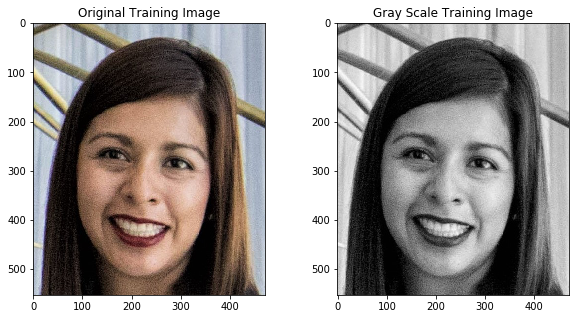

In [2]:
# Setting the default figure size
plt.rcParams['figure.figsize'] = [10,5]

# Loading the training image
image = cv2.imread('./images/face.jpeg')

# Converting the training image to RGB
training_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Converting the training image to Grayscale
training_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Displaying the images
plt.subplot(121)
plt.title('Original Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Gray Scale Training Image')
plt.imshow(training_gray, cmap = 'gray')
plt.show()

## Locating Keypoints

The first step in the ORB algorithm is to locate all the keypoints in the training image. After the keypoints have been located, ORB creates their corresponding binary feature vectors and groups them together in the ORB descriptor.

OpenCV’s `ORB` class is used to locate the keypoints and create their corresponding ORB descriptor. The parameters of the `ORB_create()` function and their default values are given below:


`cv2.ORB_create(nfeatures = 500,
               scaleFactor = 1.2,
		       nlevels = 8,
		       edgeThreshold = 31,
		       firstLevel = 0,
		       WTA_K = 2,
		       scoreType = HARRIS_SCORE,
		       patchSize = 31,
		       fastThreshold = 20)`
    
***Parameters***

* `nfeatures` - *int*  
Determines the maximum number of features (keypoints) to locate.


* `scaleFactor` - *float*  
Pyramid decimation ratio, must be greater than 1. ORB uses an image pyramid to find features, therefore a scale factor between each layer in the pyramid should be provided. A `scaleFactor = 2` means the next level has 4x less pixels than the previous. A big scale factor will diminish the number of features found.


* `nlevels` - *int*  
The number of pyramid levels. The smallest level will have a linear size equal to 
$$ smallest\ image\ linear\ size = \frac{input\ image\ linear\ size}{scale\ factor^{\ nlevels}} $$


* `edgeThreshold` - - *int*  
The size of the border where features are not detected. Since the keypoints have a specific pixel size, the edges of images must be excluded from the search. The size of the `edgeThreshold` should be equal to or greater than the `patchSize`.


* `firstLevel` - *int*  
This parameter allows you to determine which level should be treated as the first level in the pyramid. It should be 0 in the current implementation. Usually, the pyramid level with a scale of unity is considered the first level.


* `WTA_K` - *int*  
The number of random pixels used to produce each element of the oriented BRIEF descriptor. The possible values are 2, 3, and 4, with 2 being the default value. For example, a value of 3 means three random pixels are chosen at a time to compare their brightness. The index of the brightest pixel is returned. Since there are 3 pixels, the returned index will be either 0, 1, or 2.


* `scoreType` - *int*  
This parameter can be set to either HARRIS_SCORE or FAST_SCORE. The default HARRIS_SCORE means that the Harris corner algorithm is used to rank features. The score is used to only retain the best features. The FAST_SCORE produces slightly less stable keypoints, but it is a little faster to compute.


* `patchSize` - *int*  
Size of the patch used by the oriented BRIEF descriptor. On smaller pyramid layers the perceived image area covered by a feature will be larger.


The first two arguments (`nfeatures` and ` scaleFactor`) are probably the ones you are most likely to change. The other parameters can be safely left at their default values to get good results.

`.detectAndCompute(image)` method is used to locate the keypoints in the training image and to compute their corresponding ORB descriptor. ` cv2.drawKeypoints()`function to visualize the keypoints found by the ORB algorithm.


Number of keypoints Detected:  175


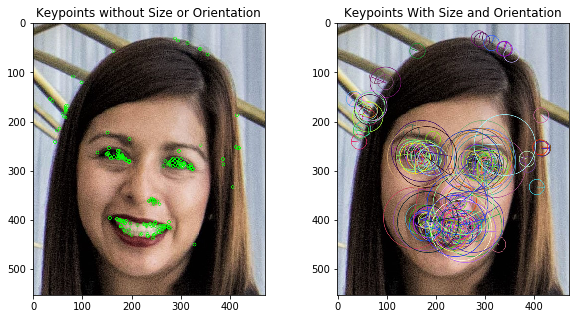

In [3]:
# Setting the default figure size
plt.rcParams['figure.figsize'] = [10, 5]

# Setting the parameters of the ORB algorithm
orb = cv2.ORB_create(200, 2.0)

# Finding the keypoints in the gray scale training image and computing their ORB descriptor
# The None parameter indicates that a mask is not used
keypoints, descriptor = orb.detectAndCompute(training_gray, None)

# Printing the number of keypoints detected
print("\nNumber of keypoints Detected: ", len(keypoints))

# Creating copies of the training image to draw the keypoints
keyp_without_size = copy.copy(training_image)
keyp_with_size = copy.copy(training_image)

# Drawing keypoints without size or orientation
cv2.drawKeypoints(training_image, keypoints, keyp_without_size, color = (0, 255, 0))

# Drawing keypoints with size and orientation
cv2.drawKeypoints(training_image, keypoints, keyp_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Displaying image with keypoints without size or orientation
plt.subplot(121)
plt.title('Keypoints without Size or Orientation')
plt.imshow(keyp_without_size)

# Displaying image with keypoints with size and orientation
plt.subplot(122)
plt.title('Keypoints With Size and Orientation')
plt.imshow(keyp_with_size)
plt.show()

In the right image, every keypoint has a center, a size, and an angle. 

- Center - determines the location of each keypoint in the image 
- Size - determiines the patch size used by `BRIEF` to create its feature vector
- Angle - indicates the orientation of the keypoint as determined by `rBRIEF`.

Once the keypoints for the training image have been found and their corresponding ORB descriptor has been calculated, the same thing can be done for the query image.

## Feature Matching

After calculating the ORB descriptors for *both* the training and query images, the final step is to perform keypoint matching between the two images using their corresponding ORB descriptors. This *matching* is usually performed by a matching function. One of the most commonly used matching functions is called *Brute-Force*.

OpenCV’s `BFMatcher` class is used to compare the keypoints in the training and query images. The parameters of the `cv2.BFMatcher()`function and their default values are as following:

`cv2.BFMatcher(normType = cv2.NORM_L2,
		 	  crossCheck = false)`

**Parameters**

* `normType`  
Specifies the metric used to determine the quality of the match. By default, `normType = cv2.NORM_L2`, which measures the distance between two descriptors.  However, for binary descriptors like the ones created by ORB (`WTA_K = 2` which returns either 0 or 1), the Hamming metric (`cv2.NORM_HAMMING`) is more suitable, it determines the distance by counting the number of dissimilar bits between the binary descriptors. If, the ORB descriptor is created using `WTA_K = 3` i.e. three random pixels are chosen and compared in brightness, the index of the brightest pixel is returned as either 0, 1, or 2, such output will occupy 2 bits, and therefore a special variant of the Hamming distance, known as the `cv2.NORM_HAMMING2` (the 2 stands for 2 bits), should be used instead. For comparing the keypoints in the training and query images, the pair with the smaller metric is considered the best match.


* `crossCheck` - *bool* 
A Boolean variable and can be set to either `True` or `False`. Cross-checking is very useful for eliminating false matches. Cross-checking works by performing the matching procedure two times. The first time the keypoints in the training image are compared to those in the query image; the second time, however, the keypoints in the query image are compared to those in the training image. When cross-checking is enabled a match is considered valid only if keypoint *A* in the training image is the best match of keypoint *B* in the query image and vice-versa. 

`.match(descriptors_train, descriptors_query)` method is used to find the matching keypoints between the training and query images using their ORB descriptors. ` cv2.drawMatches()` function is used to visualize the matching keypoints found by the Brute-Force matcher.  

In order to see the properties of the ORB algorithm more clearly, we will use the same image as our training and query image.    

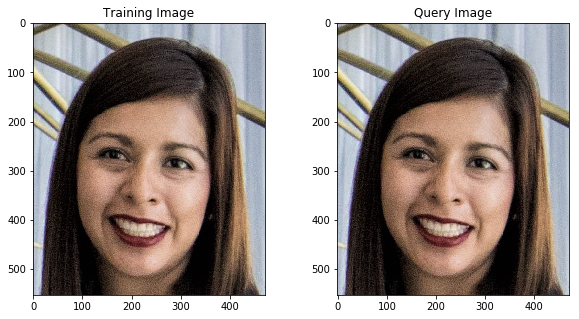

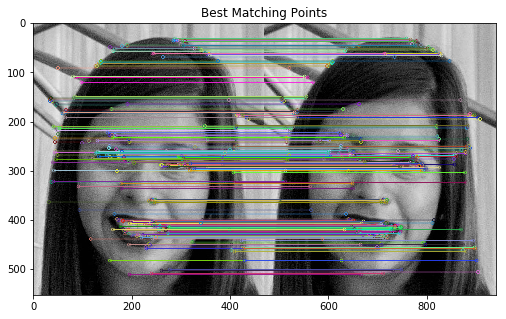

Number of Keypoints Detected in The Training Image:  821
Number of Keypoints Detected In The Query Image:  821
Number of Matching Keypoints between the Training and Query Images:  821


In [4]:
# Setting the default figure size
plt.rcParams['figure.figsize'] = [10, 5]

# Loading the training image and query image
image1 = cv2.imread('./images/face.jpeg')
image2 = cv2.imread('./images/face.jpeg')

# Converting the images to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Displaying the training and query images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Converting the images to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Setting the parameters of the ORB algorithm
orb = cv2.ORB_create(1000, 2.0)

# Finding the keypoints in both the images and computing their ORB descriptor
# The None parameter indicates that a mask is not used
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck to True so that the BFMatcher will only return consistent
# crossCheck to True ensures best results with minimal number of outliers when there are enough matches
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Performing matching between the ORB descriptors of the images
matches = bf.match(descriptors_train, descriptors_query)

# Sorting the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connecting the keypoints in the training image with their best matching keypoints in the query image
# Drawing first 300 matches and keypoints without size or orientation using flags = 2
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:300], query_gray, flags = 2)

# Displaying the best matches
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Printing the number of keypoints detected and matches
print("Number of Keypoints Detected in The Training Image: ", len(keypoints_train))
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))
print("Number of Matching Keypoints between the Training and Query Images: ", len(matches))

Since both the training and query images are the exactly the same, the same number of keypoints are found in both images, and that all the keypoints match.

## ORB's Main Properties

Some of the main properties of the ORB algorithm are:

* Scale Invariance
* Rotational Invariance
* Illumination Invariance
* Noise Invariance

In order to understand the properties of the ORB algorithm more clearly, we will use the same image as our training and query image.  

#### Scale Invariance

The ORB algorithm is scale invariant. This means that it is able to detect objects in images regardless of their size. To verify this, we will match points between training image and query image that is a ¼ the size of the original training image.

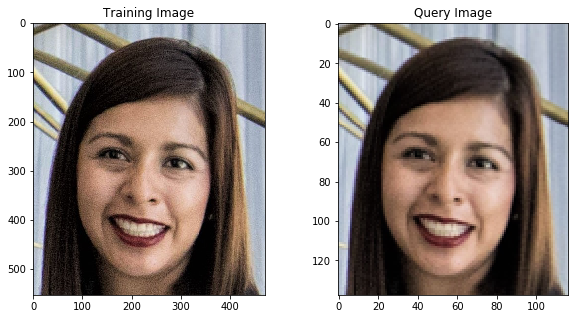

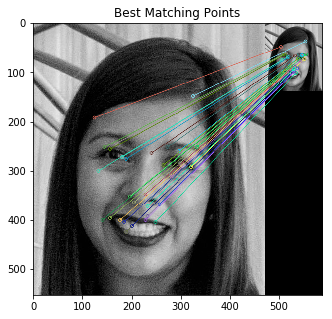

The Training Image has shape: (553, 471)
The Query Image has shape: (138, 117)

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  65

Number of Matching Keypoints Between The Training and Query Images:  60


In [5]:
# Setting the default figure size
plt.rcParams['figure.figsize'] = [10, 5]

# Loading the training image and the query image
image1 = cv2.imread('./images/face.jpeg')
image2 = cv2.imread('./images/faceQS.png')

# Converting the images to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Displaing the images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Converting the images to Grayscale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Setting the parameters of the ORB algorithm (max no. of keypoints, pyramid decimation ratio)
orb = cv2.ORB_create(1000, 2.0)

# Finding the keypoints and computing the ORB descriptors of the image
# 'None' parameter specifies that a mask is not used
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Creating a Brute Force Matcher object 
# Setting crossCheck to 'True' to ensure consistent results
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Matching the ORB descriptors
matches = bf.match(descriptors_train, descriptors_query)

# Sorting the matches according to shortest distance
matches = sorted(matches, key = lambda x : x.distance)

# Plotting the first 30 mathces 
# flags = 2 to plot the matching keypoints without size or orientation
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:30], query_gray, flags = 2)

# Displaying the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Printing the useful information
print('The Training Image has shape:', training_gray.shape)
print('The Query Image has shape:', query_gray.shape)
print("\nNumber of Keypoints Detected In The Training Image: ", len(keypoints_train))
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

The query image is 138 x 117 pixels,  ¼ the size of the original training image. Also the number of keypoints detected in the query image is only 65, much smaller than the 831 keypoints found in the training image. Nevertheless, the Brute-Force matcher can match most of the keypoints in the query image with their corresponding keypoints in the training image.

#### Rotational Invariance

The ORB algorithm is also rotationally invariant. This means that it is able to detect objects in images regardless of their orientation. To verify this, we will now use Brute-Force matcher to match points between the training image and a query image that has been rotated by 90 degrees. 

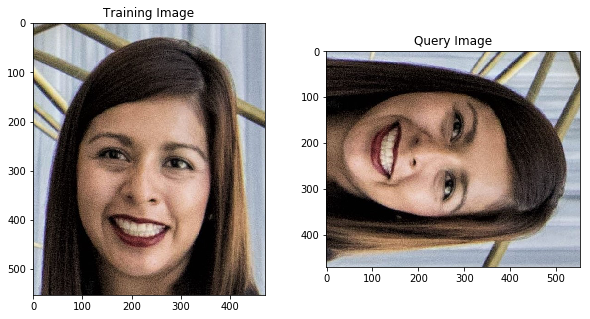

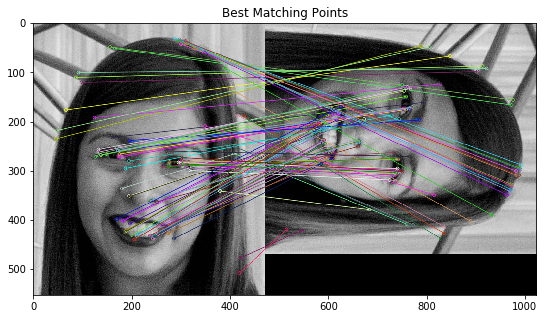

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  836

Number of Matching Keypoints Between The Training and Query Images:  645


In [6]:
# Setting the default figure size
plt.rcParams['figure.figsize'] = [10, 5]

# Loading the training image and query image
image1 = cv2.imread('./images/face.jpeg')
image2 = cv2.imread('./images/faceR.jpeg')

# Converting the images to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Displaying the images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Convert the images to grayscale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Setting the parameters of the ORB algorithm
orb = cv2.ORB_create(1000, 2.0)

# Finding the keypoints and computing their ORB descriptor
# 'None' parameter indicates that a mask is not used
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Creating a Brute Force Matcher object 
# Setting crossCheck to True to ensure consitent results
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Performing matching between the ORB descriptors
matches = bf.match(descriptors_train, descriptors_query)

# Sorting the matches according to shortest distance
matches = sorted(matches, key = lambda x : x.distance)

# Plotting the first 100 mathces 
# flags = 2 to plot the matching keypoints without size or orientation
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:100], query_gray, flags = 2)

# Displaying the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Printing useful information
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

In the above example, the number of keypoints detected in both images is very similar, and even though the query image is rotated, Brute-Force matcher can still match about 78% of the keypoints found. Also, most of the matching keypoints are close to particular facial features, such as the eyes, nose, and mouth.

#### Illumination Invariance

The ORB algorithm is also illumination invariant. This means that it is able to detect objects in images regardless of their illumination. To verify this, we will now use Brute-Force matcher to match points between the training image and a query image that is much brighter.

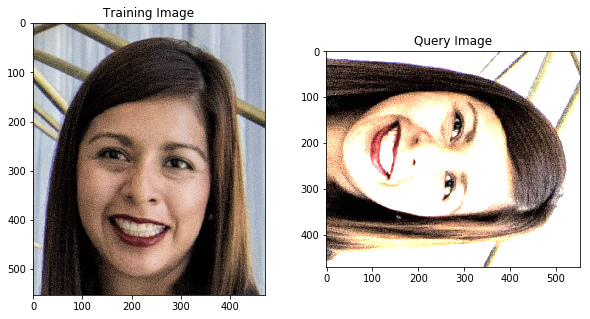

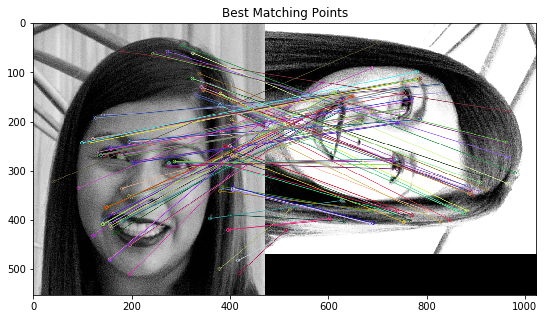

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  846

Number of Matching Keypoints Between The Training and Query Images:  505


In [11]:
# Setting the default figure size
plt.rcParams['figure.figsize'] = [10, 5]

# Loading the training image and query image
image1 = cv2.imread('./images/face.jpeg')
image2 = cv2.imread('./images/faceRI.png')

# Converting the images to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Displayng the images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Converting the images to grayscale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Setting the parameters of the ORB algorithm
orb = cv2.ORB_create(1000, 2)

# Finding the keypoints and computing their ORB descriptor
# 'None' parameter indicates that a mask is not used
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Creating a Brute Force Matcher object 
# Setting crossCheck to True to ensure consitent results
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Performing matching between the ORB descriptors
matches = bf.match(descriptors_train, descriptors_query)

# Sorting the matches according to shortest distance
matches = sorted(matches, key = lambda x : x.distance)

# Plotting the first 100 mathces 
# flags = 2 to plot the matching keypoints without size or orientation
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:100], query_gray, flags = 2)

# Displaying the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Printing useful information
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

In the above example, the number of keypoints detected in both images is again very similar, and that even though the query image is much brighter, the Brute-Force matcher can still match about 63% of the keypoints found. 

#### Noise Invariance

The ORB algorithm is also noise invariant. This means that it is able to detect objects in images, even if the images have some degree of noise. To verify this, we will use Brute-Force matcher to match points between the training image and a query image that has a lot of noise.

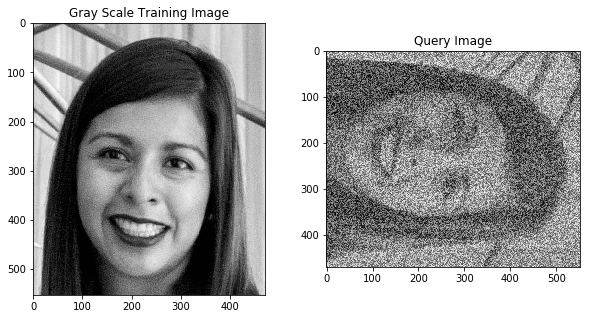

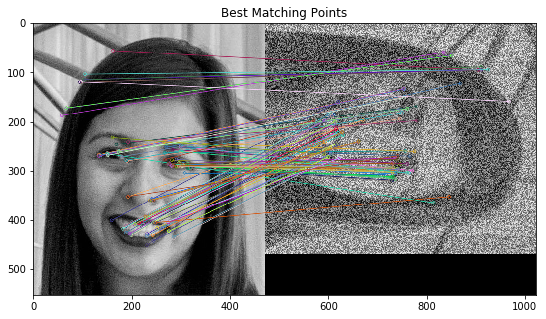

Number of Keypoints Detected In The Training Image:  896
Number of Keypoints Detected In The Query Image:  926

Number of Matching Keypoints Between The Training and Query Images:  558


In [13]:
# Setting the default figure size
plt.rcParams['figure.figsize'] = [10, 5]

# Loading the training image
image1 = cv2.imread('./images/face.jpeg')

# Load the noisy and gray scale query image
image2 = cv2.imread('./images/faceRN5.png')

# Converting the images to grayscale
query_gray = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
training_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

# Displaying the images
plt.subplot(121)
plt.imshow(training_gray, cmap = 'gray')
plt.title('Gray Scale Training Image')
plt.subplot(122)
plt.imshow(query_gray, cmap = 'gray')
plt.title('Query Image')
plt.show()

# Setting the parameters of the ORB algorithm
orb = cv2.ORB_create(1000, 1.3)

# Finding the keypoints and computing their ORB descriptor
# 'None' parameter indicates that a mask is not used
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Creating a Brute Force Matcher object 
# Setting crossCheck to True to ensure consitent results
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Performing matching between the ORB descriptors
matches = bf.match(descriptors_train, descriptors_query)

# Sorting the matches according to shortest distance
matches = sorted(matches, key = lambda x : x.distance)

# Plotting the first 100 mathces 
# flags = 2 to plot the matching keypoints without size or orientation
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:100], query_gray, flags = 2)

# Displaying the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Printing useful information
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

In the above example, again we see that the number of keypoints detected in both images is very similar, and that even though the query image is has a lot of noise, Brute-Force matcher can still match about 63% of the keypoints found.  Also, most of the matching keypoints are close to particular facial features, such as the eyes, nose, and mouth. 

In addition, there are a few features that don’t quite match up, but may have been chosen because of similar patterns of intensity in that area of the image.  Also, a pyramid decimation ratio of 1.3, instead of the of value of 2.0 as in previous examples, produces better results. 

## Object Detection

Implementing the ORB algorithm to detect the face in the training image in another image.

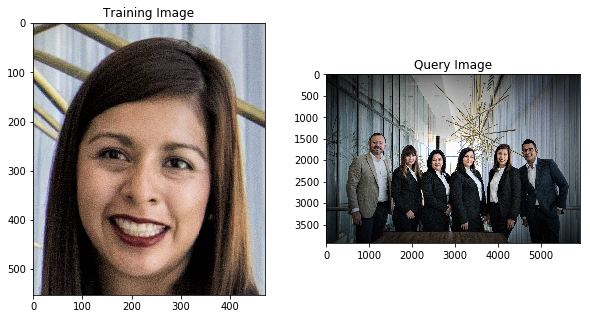

In [15]:
# Setting the default figure size
plt.rcParams['figure.figsize'] = [10, 5]

# Loading the training image and the query image
image1 = cv2.imread('./images/face.jpeg')
image2 = cv2.imread('./images/Team.jpeg')

# Convert the images to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Displaying the images
plt.subplot(121)
plt.imshow(training_image)
plt.title('Training Image')
plt.subplot(122)
plt.imshow(query_image)
plt.title('Query Image')
plt.show()

In this particular case, the training image contains a face, therefore, as we have seen, the majority of the keypoints detected are close to facial features, such as the eyes, nose, and mouth. On the other hand, the query image is a picture of a group of people, one of which, is the woman we want to detect.

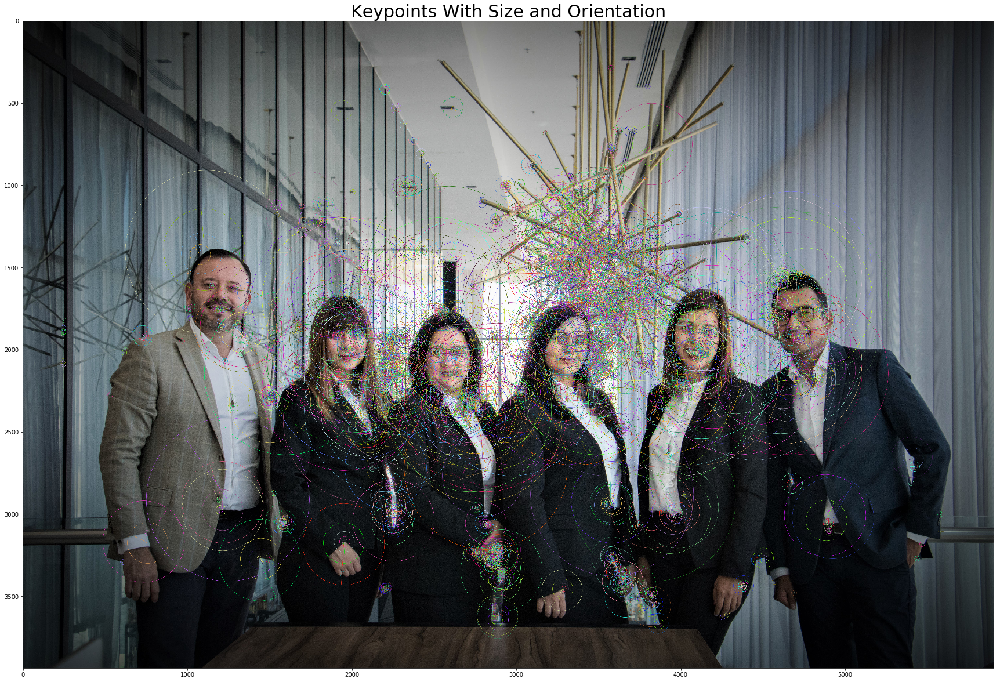

Number of keypoints Detected:  4941


In [16]:
# Setting the default figure size
plt.rcParams['figure.figsize'] = [30, 30]

# Converting the images to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)


# Setting the parameters of the ORB algorithm
orb = cv2.ORB_create(5000, 2.0)

# Finding the keypoints and computing their ORB descriptor
# 'None' parameter indicates that a mask is not used
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Creating a copy of the query images to draw keypoints
query_img_keyp = copy.copy(query_image)

# Draw the keypoints with size and orientation on the copy of the query image
cv2.drawKeypoints(query_image, keypoints_query, query_img_keyp, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Displaying the query image with the keypoints with size and orientation
plt.title('Keypoints With Size and Orientation', fontsize = 30)
plt.imshow(query_img_keyp)
plt.show()

# Printing the number of keypoints detected
print("Number of keypoints Detected: ", len(keypoints_query))

The query image has keypoints in many parts of the image. Now we can use a Brute-Force matcher to try to locate the woman’s face in the query image. 

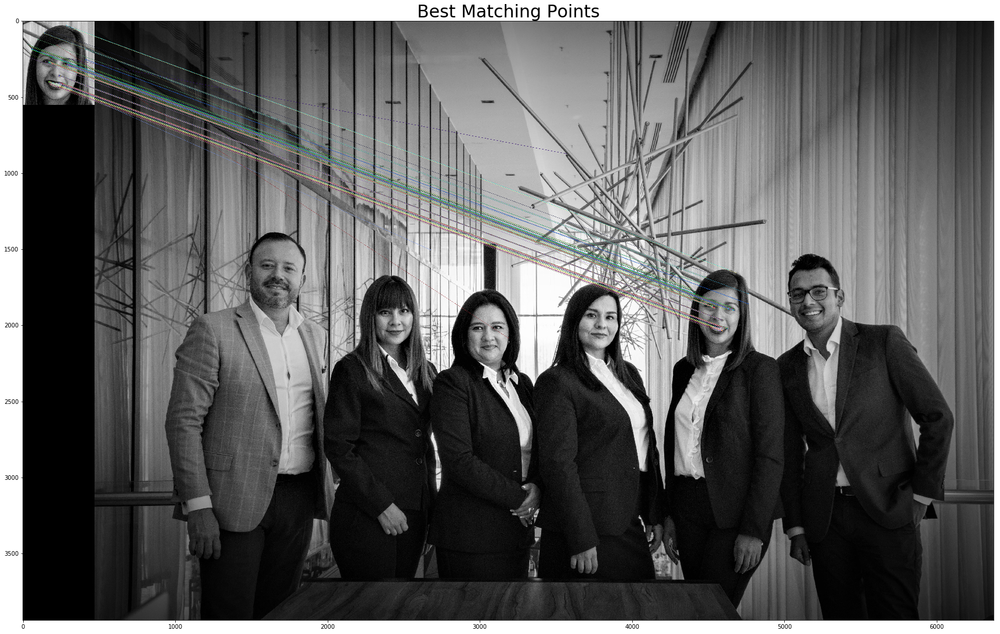

Number of Keypoints Detected In The Training Image:  2506
Number of Keypoints Detected In The Query Image:  4941

Number of Matching Keypoints Between The Training and Query Images:  1571


In [17]:
# Setting the default figure size
plt.rcParams['figure.figsize'] = [30, 30]

# Creating a Brute Force Matcher object 
# Setting crossCheck to True to ensure consitent results
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Performing matching between the ORB descriptors
matches = bf.match(descriptors_train, descriptors_query)

# Sorting the matches according to shortest distance
matches = sorted(matches, key = lambda x : x.distance)

# Plotting the first 100 mathces 
# flags = 2 to plot the matching keypoints without size or orientation
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:100], query_gray, flags = 2)

# Displaying the best matching points
plt.title('Best Matching Points', fontsize = 30)
plt.imshow(result)
plt.show()

# Printing useful information
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

Even though there are many faces and objects in the query image, Brute-Force matcher has been able to correctly locate the woman’s face in the query image.